In [1]:
import numpy as np
from pandas import Series, DataFrame
import pandas as pd
import altair as alt
from altair import *

In [2]:
EQ = pd.read_excel("C:/CEU/USBwebserver/root/data/eq1900.xlsx")

In [10]:
EQ.head()

,I_D,FLAG_TSUNAMI,YEAR,MONTH,DAY,HOUR,MINUTE,SECOND,COUNTRY,country_code,...,TOTAL_MISSING,TOTAL_MISSING_DESCRIPTION,TOTAL_INJURIES,TOTAL_INJURIES_DESCRIPTION,TOTAL_DAMAGE_MILLIONS_DOLLARS,TOTAL_DAMAGE_DESCRIPTION,TOTAL_HOUSES_DESTROYED,TOTAL_HOUSES_DESTROYED_DESCRIPTION,TOTAL_HOUSES_DAMAGED,TOTAL_HOUSES_DAMAGED_DESCRIPTION
0,2566,NaN,1900,1.0,11.0,9.0,7.0,,JAPAN,JPN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2567,NaN,1900,1.0,14.0,NaN,NaN,NaN,INDONESIA,IDN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,3.0
2,2569,NaN,1900,1.0,20.0,6.0,33.0,30,MEXICO,MEX,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,2571,NaN,1900,5.0,16.0,20.0,12.0,,MEXICO,MEX,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2572,NaN,1900,6.0,7.0,22.0,NaN,,VENEZUELA,VEN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
EQ.describe()

C:\Users\828142\AppData\Local\Continuum\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


,I_D,YEAR,MONTH,DAY,HOUR,MINUTE,FOCAL_DEPTH,EQ_PRIMARY,EQ_MAG_MW,EQ_MAG_MS,...,TOTAL_MISSING,TOTAL_MISSING_DESCRIPTION,TOTAL_INJURIES,TOTAL_INJURIES_DESCRIPTION,TOTAL_DAMAGE_MILLIONS_DOLLARS,TOTAL_DAMAGE_DESCRIPTION,TOTAL_HOUSES_DESTROYED,TOTAL_HOUSES_DESTROYED_DESCRIPTION,TOTAL_HOUSES_DAMAGED,TOTAL_HOUSES_DAMAGED_DESCRIPTION
count,3308.000000,3308.000000,3304.000000,3301.000000,3170.000000,3142.000000,2657.000000,3308.000000,1053.000000,2186.000000,...,23.000000,21.000000,1009.000000,1134.000000,379.000000,1992.000000,5.610000e+02,970.000000,2.790000e+02,502.000000
mean,5571.493047,1969.173821,6.511501,15.826416,11.251420,29.113622,42.738050,6.402278,6.537607,6.505947,...,2000.695652,1.857143,2794.274529,1.991182,2089.372388,2.070281,2.383681e+04,2.692784,8.566738e+04,2.480080
std,2088.150638,34.241856,3.455594,8.790827,7.086951,17.340095,72.739078,1.012517,0.941467,0.999419,...,9043.134249,1.014185,30348.579443,1.090726,13616.671799,1.052170,2.348713e+05,1.104662,1.257372e+06,1.791141
min,2566.000000,1900.000000,1.000000,1.000000,0.000000,0.000000,0.000000,4.000000,4.000000,2.100000,...,1.000000,1.000000,1.000000,1.000000,0.010000,1.000000,1.000000e+00,1.000000,1.000000e+00,1.000000
25%,3971.500000,1940.000000,NaN,NaN,NaN,NaN,NaN,5.600000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,5182.500000,1976.000000,NaN,NaN,NaN,NaN,NaN,6.400000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,6622.250000,2002.000000,NaN,NaN,NaN,NaN,NaN,7.206944,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,10182.000000,2016.000000,12.000000,31.000000,23.000000,59.000000,678.000000,9.500000,9.500000,9.100000,...,43476.000000,4.000000,799000.000000,4.000000,220085.456000,4.000000,5.360000e+06,4.000000,2.100000e+07,34.000000


In this dataset we are using the earthquake magnitude greater than 4.00 and happened starting from the year 1900
If there was no magnitude recorded for a given earthquake, we used the mean average value for that country

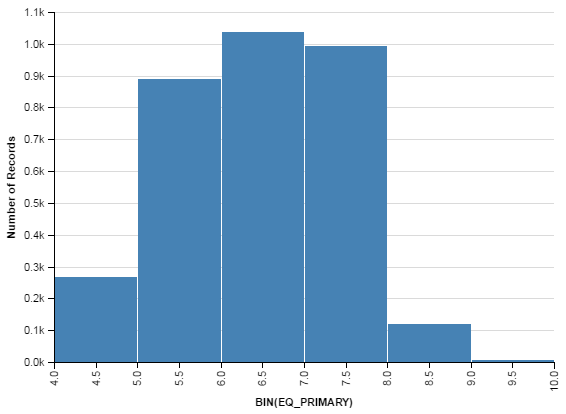

In [8]:
#HISTOGRAM OF MAGNITUDE shows that magnitude 6.5 is the most frequent. 
#Or Not? Maybe?
Chart(EQ).mark_bar().encode(
    x=X('EQ_PRIMARY', bin=Bin(maxbins=10)),
    y='count(*):Q',
)

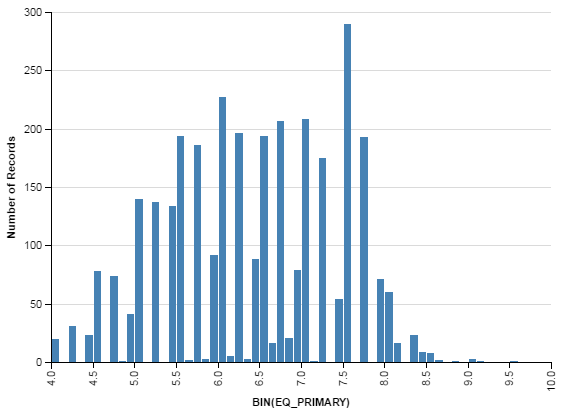

In [7]:
#Actuall, it turns out, magnitude 7.5 is the most frequent
Chart(EQ).mark_bar().encode(
    x=X('EQ_PRIMARY', bin=Bin(maxbins=100)),
    y='count(*):Q',
)

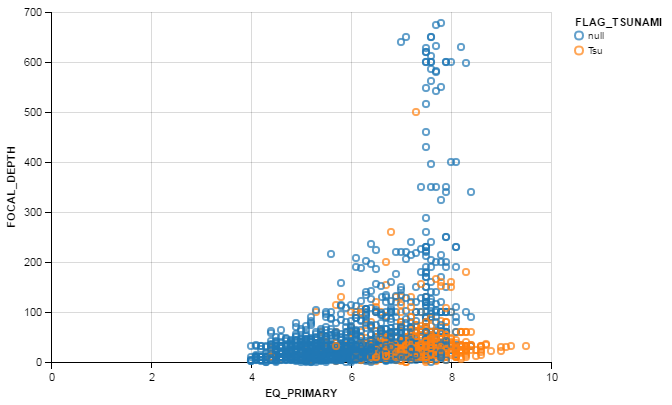

In [32]:
#Low magnitude earthquakes have Focal Depth 
#less than 100 kilometers in all the cases
Chart(EQ).mark_point().encode(
    x='EQ_PRIMARY',
    y='FOCAL_DEPTH',
    color='FLAG_TSUNAMI:N'
)

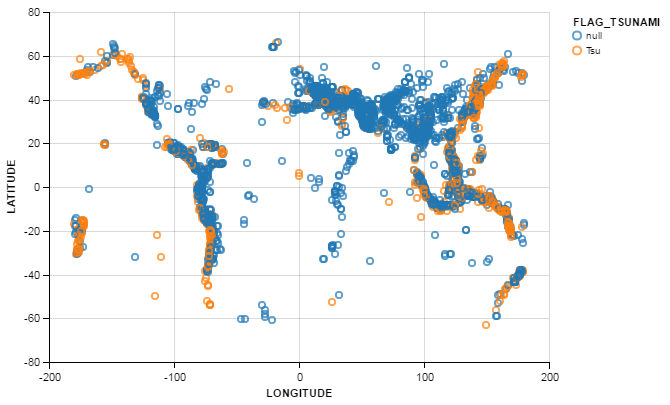

In [9]:
# World Map of Earthquakes and Tsunamis
Chart(EQ).mark_point().encode(
    x='LONGITUDE',
    y='LATITUDE',
    color='FLAG_TSUNAMI:N'
)